In [ ]:
!pip install pandas-profiling==3.4.0
!pip install catboost
!pip install --upgrade scikit-learn
!pip install influxdb
!pip install statsmodels
!pip install prophet

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# please install holidays and verstack before running this notebook :)
from pandas_profiling import ProfileReport
import decimal
from datetime import datetime

from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, KFold
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.preprocessing import StandardScaler, RobustScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn_pandas import DataFrameMapper, gen_features
from sklearn import metrics
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.base import clone
from sklearn.preprocessing import PolynomialFeatures
from hyperopt import hp, fmin, tpe, Trials, STATUS_OK, space_eval

from sklearn.impute import SimpleImputer
from sklearn.impute import MissingIndicator
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

from sklearn.preprocessing import StandardScaler, Normalizer, OneHotEncoder, OrdinalEncoder
from sklearn.preprocessing import MinMaxScaler

from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.compose import ColumnTransformer
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.feature_selection import VarianceThreshold

from sklearn.decomposition import PCA, TruncatedSVD, NMF
from sklearn.manifold import TSNE

from sklearn import datasets
from matplotlib import offsetbox

import datetime
import pandas_profiling
import pandas as pd
import numpy as np
import math
import statsmodels.api as sm
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import product
import scipy.stats as ss
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import plotly.express as px
import plotly
from influxdb import InfluxDBClient
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.graphics.tsaplots import plot_acf
from scipy.stats import linregress

from sklearn.linear_model import Ridge
from sklearn.linear_model import PoissonRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor
from catboost import CatBoostRegressor
from sklearn.linear_model import Lasso
from sklearn.metrics import make_scorer
from sklearn import set_config
from sklearn.base import BaseEstimator, RegressorMixin, TransformerMixin

import matplotlib
import matplotlib.pyplot as plt
from influxdb import InfluxDBClient
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.graphics.tsaplots import plot_acf
from scipy.stats import linregress

import os
import scipy.stats as st
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import TimeSeriesSplit
from statsmodels.distributions.empirical_distribution import ECDF
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller, kpss, acf, pacf
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt
from prophet import Prophet
# import fbprophet
# from pyramid import auto_arima

import warnings
import random

seed = 42

from IPython.display import set_matplotlib_formats
warnings.filterwarnings('ignore')
%matplotlib inline

# 1. Data Preparation

In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
path = "/content/drive/MyDrive/EPAM_Data_Science/Homeworks/HW10/data/hour.csv"
data = pd.read_csv(path, sep=",")
data

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0000,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0000,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0000,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0000,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0000,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17374,17375,2012-12-31,1,1,12,19,0,1,1,2,0.26,0.2576,0.60,0.1642,11,108,119
17375,17376,2012-12-31,1,1,12,20,0,1,1,2,0.26,0.2576,0.60,0.1642,8,81,89
17376,17377,2012-12-31,1,1,12,21,0,1,1,1,0.26,0.2576,0.60,0.1642,7,83,90
17377,17378,2012-12-31,1,1,12,22,0,1,1,1,0.26,0.2727,0.56,0.1343,13,48,61


In [ ]:
print(data.shape)
print(data.dtypes.value_counts())
print(data.dtypes)

(17379, 17)
int64      12
float64     4
object      1
dtype: int64
instant         int64
dteday         object
season          int64
yr              int64
mnth            int64
hr              int64
holiday         int64
weekday         int64
workingday      int64
weathersit      int64
temp          float64
atemp         float64
hum           float64
windspeed     float64
casual          int64
registered      int64
cnt             int64
dtype: object


Instant is just the id, so I will delete that column.

In [ ]:
# if "instant" in data.columns:
#   data = data.drop(["instant"], axis=1)

Here I will add the missing point to the data, as we are going to look at it from Time Series perspective, and seasonality will be very important. The missing values I will impute by the previous values.

In [ ]:
data["dteday"] = pd.to_datetime(data["dteday"])

In [ ]:
data["time"] = data["hr"].apply(lambda x: datetime.datetime.strptime(f'{x}:30', '%H:%M').time())
data["datetime"] = pd.to_datetime(data['dteday'].astype(str) + ' ' + data['time'].astype(str))
first_date = data["datetime"][0]
#data = data.set_index(['datetime'])

In [ ]:
if "time" in data.columns:
  data = data.drop(["time"], axis=1)

In [ ]:
date_list = []
const_col = []
date_list.append(first_date)
const_col.append(1)
for i in range((2*365+1)*24-1):
  first_date = first_date + datetime.timedelta(hours=1)
  date_list.append(first_date)
  const_col.append(1)

In [ ]:
new_data = pd.DataFrame({'datetime': date_list, 'const': const_col})

In [ ]:
data = new_data.merge(data, on='datetime', how='left')

In [ ]:
if "const" in data.columns:
  data = data.drop(["const"], axis=1)


In [ ]:
data

,datetime,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,2011-01-01 00:30:00,1.0,2011-01-01,1.0,0.0,1.0,0.0,0.0,6.0,0.0,1.0,0.24,0.2879,0.81,0.0000,3.0,13.0,16.0
1,2011-01-01 01:30:00,2.0,2011-01-01,1.0,0.0,1.0,1.0,0.0,6.0,0.0,1.0,0.22,0.2727,0.80,0.0000,8.0,32.0,40.0
2,2011-01-01 02:30:00,3.0,2011-01-01,1.0,0.0,1.0,2.0,0.0,6.0,0.0,1.0,0.22,0.2727,0.80,0.0000,5.0,27.0,32.0
3,2011-01-01 03:30:00,4.0,2011-01-01,1.0,0.0,1.0,3.0,0.0,6.0,0.0,1.0,0.24,0.2879,0.75,0.0000,3.0,10.0,13.0
4,2011-01-01 04:30:00,5.0,2011-01-01,1.0,0.0,1.0,4.0,0.0,6.0,0.0,1.0,0.24,0.2879,0.75,0.0000,0.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17539,2012-12-31 19:30:00,17375.0,2012-12-31,1.0,1.0,12.0,19.0,0.0,1.0,1.0,2.0,0.26,0.2576,0.60,0.1642,11.0,108.0,119.0
17540,2012-12-31 20:30:00,17376.0,2012-12-31,1.0,1.0,12.0,20.0,0.0,1.0,1.0,2.0,0.26,0.2576,0.60,0.1642,8.0,81.0,89.0
17541,2012-12-31 21:30:00,17377.0,2012-12-31,1.0,1.0,12.0,21.0,0.0,1.0,1.0,1.0,0.26,0.2576,0.60,0.1642,7.0,83.0,90.0
17542,2012-12-31 22:30:00,17378.0,2012-12-31,1.0,1.0,12.0,22.0,0.0,1.0,1.0,1.0,0.26,0.2727,0.56,0.1343,13.0,48.0,61.0


In [ ]:
cols_to_impute = list(data.columns)
cols_to_impute.remove("datetime")
cols_to_impute.remove("dteday")

In [ ]:
for col in cols_to_impute:
  median = data[col].median()
  data[col].fillna(method="ffill", inplace=True)

In [ ]:
# if "dteday" in data.columns:
#   data = data.drop(["dteday"], axis=1)

In [ ]:
print(data.isnull().sum())

datetime        0
instant         0
dteday        165
season          0
yr              0
mnth            0
hr              0
holiday         0
weekday         0
workingday      0
weathersit      0
temp            0
atemp           0
hum             0
windspeed       0
casual          0
registered      0
cnt             0
dtype: int64


Given the context of the data I think deleteing outliers would be meaningless in this case, as they may not be outliers but rather specific days with high activity. Also it would hurt the time series analysis as we would lose some point in the timeline.

# 2. EDA

### A plotting function for later use

In [ ]:
def residual_plot(resid):
  color = 'maroon'

  plt.subplots(1, 2, figsize=(24, 8))

  plt.subplot(1, 2, 1)
  plt.plot(resid, '-', color=color)
  plt.grid(linestyle=':', color='k')
  plt.title("Residuals")



  x_fit = np.linspace(resid.min(), resid.max(), 201)
  loc_laplace, scale_laplace = st.laplace.fit(resid.dropna())
  loc_norm, scale_norm = st.norm.fit(resid.dropna())
  y_fit_laplace = st.laplace.pdf(x_fit, loc_laplace, scale_laplace)
  y_fit_norm = st.norm.pdf(x_fit, loc_norm, scale_norm)

  plt.subplot(1, 2, 2)
  sns.distplot(resid, color=color, bins=100, vertical=True, label="distribution of residuals")
  plt.plot(y_fit_laplace, x_fit, '-b',
          label=f"approximation by Laplace distribution:\n  fitted mean = {loc_laplace:.4g}, fitted std = {scale_laplace:.4g}")
  plt.plot(y_fit_norm, x_fit, '-g',
          label=f"approximation by normal distribution:\n  fitted mean = {loc_norm:.4g}, fitted std = {scale_norm:.4g}")
  plt.legend()
  plt.title("Distribution of residuals")
  plt.grid(linestyle=':', color='k')

  plt.show()

## 2.1 Univariate and Multivariate Analysis

In [ ]:
report = pandas_profiling.ProfileReport(data)

In [ ]:
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Fortunately we have equidistant values of data and we have no missing values.

['instant', 'season', 'yr', 'mnth', 'hr', 'holiday', 'weekday', 'workingday', 'weathersit', 'temp', 'atemp', 'hum', 'windspeed', 'casual', 'registered', 'cnt']


<AxesSubplot:>

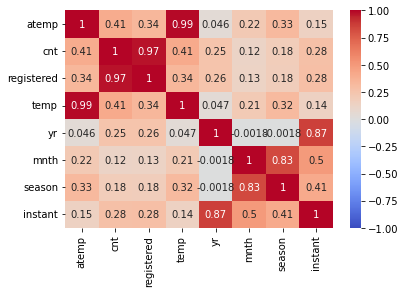

In [ ]:
data_new = data.drop(["dteday"], axis=1)
data_new = data_new.drop(["datetime"], axis=1)
top_corr_cols = []
cols = list(data_new.columns)
print(cols)
for col in cols:
  corr = data_new.corr()
  condition = np.absolute(corr[col]) > 0.8
  top_corr = corr.loc[condition,condition]
  col_list = list(top_corr.columns)
  col_list.remove(col)
  top_corr_cols += col_list
top_corr_cols = set(top_corr_cols)
top_corr_cols = list(top_corr_cols)
corr = data_new[top_corr_cols].corr()
sns.heatmap(corr, cmap="coolwarm", vmin=-1, vmax=1, annot=True)

Here we can observe some interesting correlations. As expected there is high correlation between the pairs of features seasons - months, and atemp - temp(for the temps I think leaving one of those feature is enough as they are perfectly correlated, so we will not lose any information, however I will leave them both to compare them later as asked in the assignment). Interestingly enough the correlation between cnt and registered is also extremely high, aslo indicating that most of the users are registerd.

In [ ]:
if "atemp" in data.columns:
  data = data.drop(["atemp"], axis=1)
  data_new = data_new.drop(["atemp"], axis=1)
  top_corr_cols.remove("atemp")

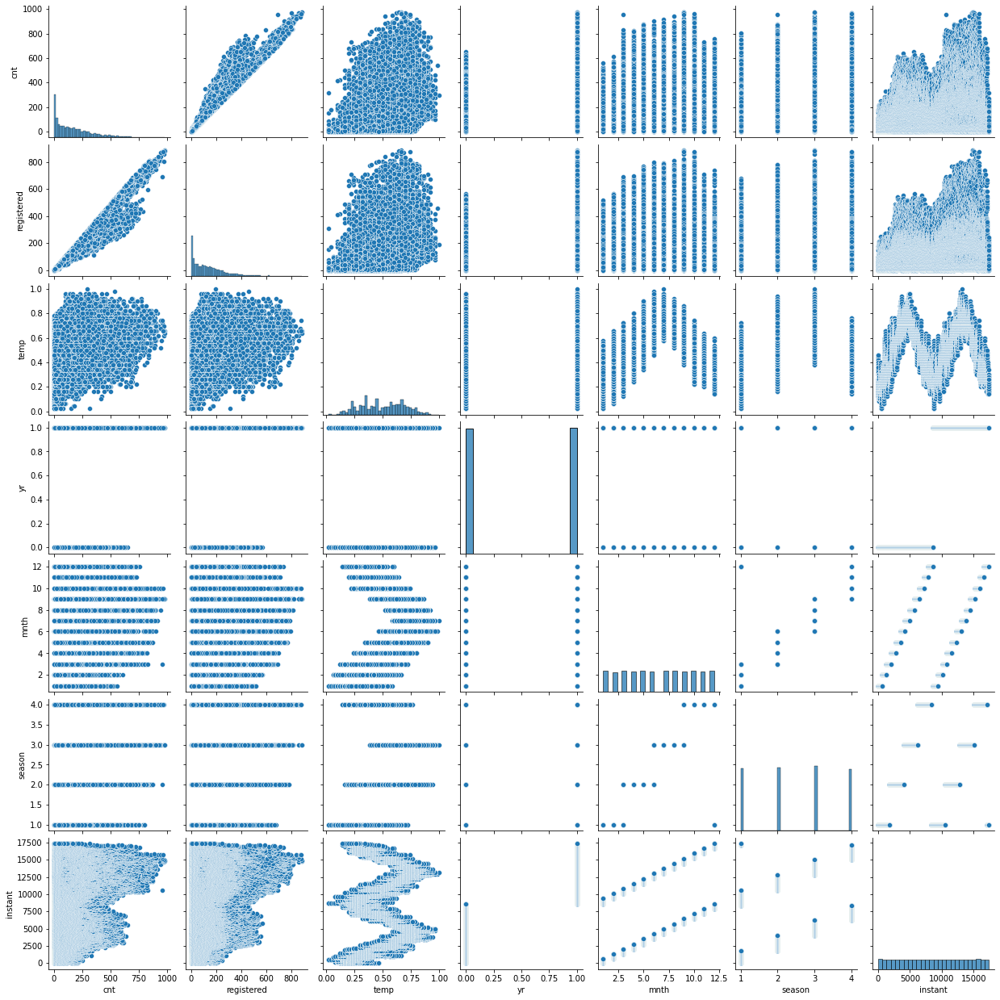

In [ ]:
pairwise_plots = sns.pairplot(data_new[top_corr_cols])

Here are the top correlations with the target feature.

instant       0.280249
season        0.180625
yr            0.252029
mnth          0.124413
hr            0.394629
holiday      -0.036084
weekday       0.029884
workingday    0.029601
weathersit   -0.152168
temp          0.408989
hum          -0.326467
windspeed     0.082617
casual        0.696276
registered    0.972385
cnt           1.000000
Name: cnt, dtype: float64


<AxesSubplot:>

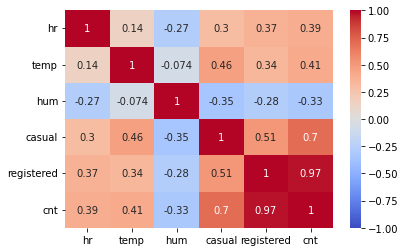

In [ ]:
corr = data_new.corr()
print(corr["cnt"])
condition = np.abs(corr["cnt"]) > 0.3
top_corr = corr.loc[condition, condition]
sns.heatmap(top_corr, cmap="coolwarm", vmin=-1, vmax=1, annot=True)

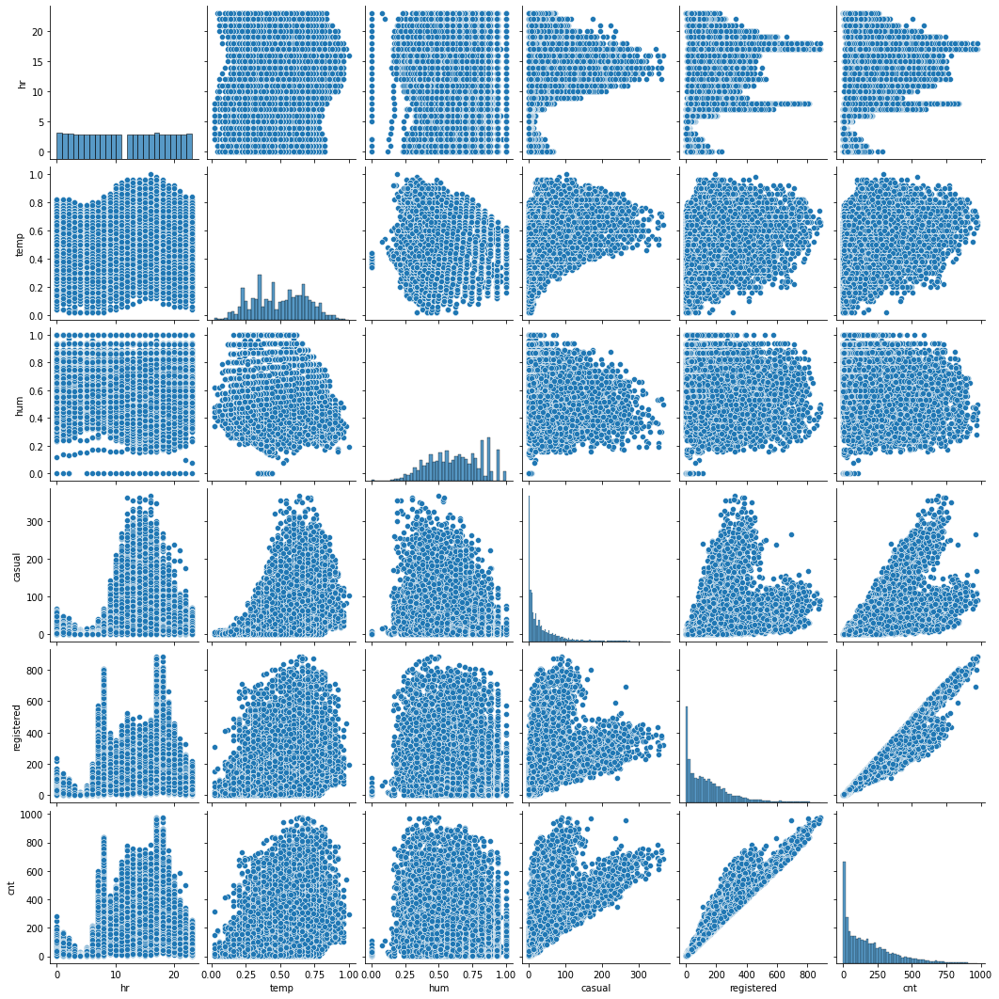

In [ ]:
pairwise_plots = sns.pairplot(data[list(top_corr.columns)])

Here I will visualize the relationship of each variable with the target variable.

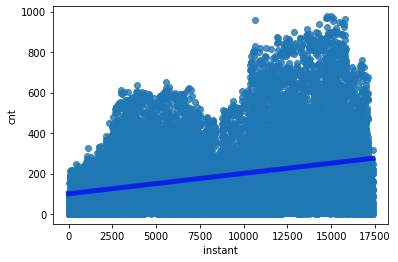

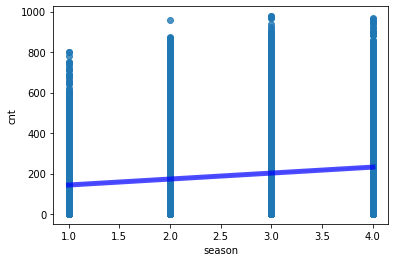

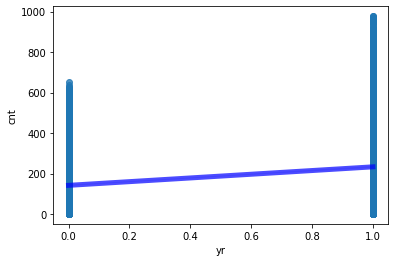

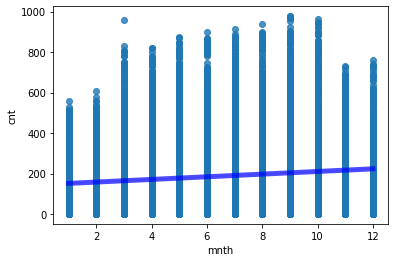

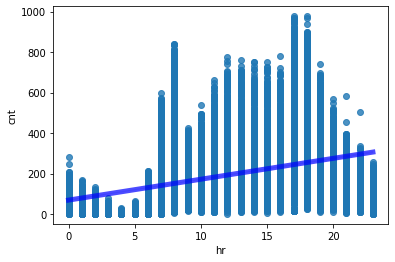

...

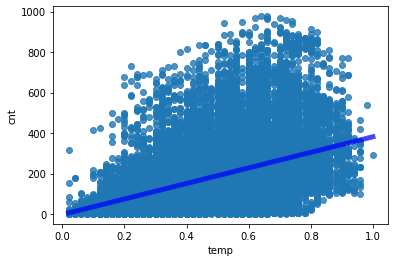

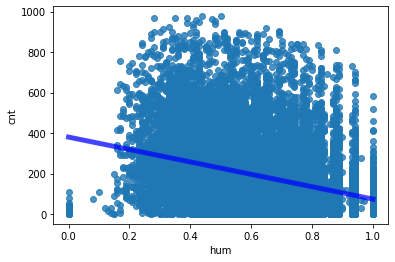

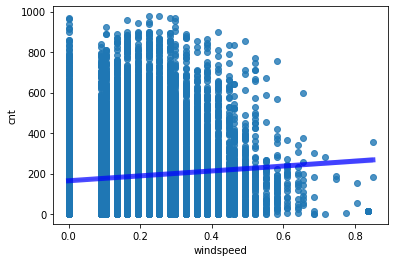

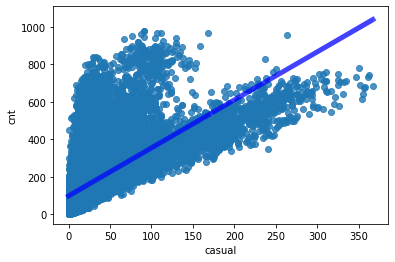

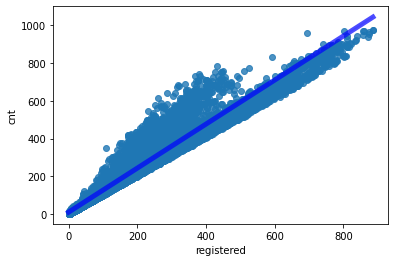

In [ ]:
# plots
cols = list(data_new.columns)
cols.remove('cnt')
for col in cols:
  sns.regplot(x=data_new[col], y=data_new["cnt"], line_kws={"color":"b","alpha":0.7,"lw":5}, label=col)
  plt.show()

## 2.2 Time Series Analytics

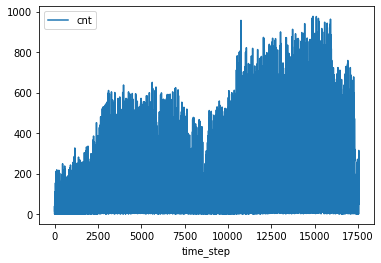

In [ ]:
num_bike = data[["cnt", "registered"]]
num_bike['time_step'] = range(0,len(num_bike['cnt']))
num_bike.plot(kind='line',x='time_step',y='cnt')
plt.show()

Very hard to see the seasonality here.

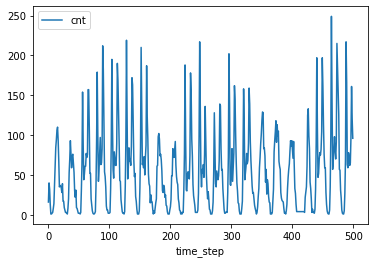

In [ ]:
num_bike = num_bike[:500]
num_bike['time_step'] = range(0,len(num_bike['cnt']))
num_bike.plot(kind='line',x='time_step',y='cnt')
plt.show()

In [ ]:
data_target = data[['dteday', 'hr', 'cnt']]

I seperated the target values and datetime indicators only.

### Autocorrelation

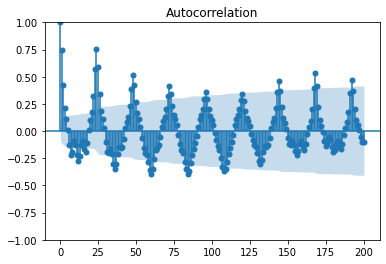

In [ ]:
plot_acf(num_bike["cnt"], lags=200)
plt.show()

We can see that there is periodicity in the autocorrelation values itself. We can see that peak of autocorrelation is every 24 hours, meaning there is quite a dependency on the hour of the day. And we can see another raise at the 7*24 point indicating weekly seasonality.

### Partial Autocorrelation

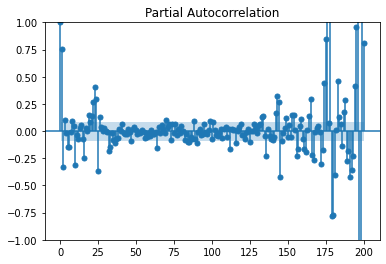

In [ ]:
plot_pacf(num_bike["cnt"], lags=200)
plt.show()

We see clear very high partial autocorrelation, indicating weekly seasonalty, I thinkly weekly will be the most influential seasonality in the data.

### Test for Stationarity

In [ ]:
y = data_target['cnt']

alpha = 0.01
print(f"alpha = {alpha}\n")

# ADF Test
print("==== Augmented Dickey–Fuller (Null hypothesis - The process is non-stationary): ")
result = adfuller(y, maxlag=24*7, autolag=None)
print(f'ADF Statistic: {result[0]:.4g}')
print(f'p-value: {result[1]:.4g}')
if result[1] < alpha:
    print("The process is stationary.")
else:
    print("The process is non-stationary.")

alpha = 0.01

==== Augmented Dickey–Fuller (Null hypothesis - The process is non-stationary): 
ADF Statistic: -2.533
p-value: 0.1076
The process is non-stationary.


Regular Augmented Dickey–Fuller test with autolag="AIC" was not finding the data to be non-stationary. But it seemed to be very suspicious as visually we can see the dependence on time and KPSS test was telling us the opposite. After some tests I found that the process is non-stationary with the lag of 30 days.

In [ ]:
print('==== Kwiatkowski–Phillips–Schmidt–Shin (KPSS) test (Null hypothesis - The process is stationary):')
# KPSS test
kpsstest = kpss(y, regression='c')
print(kpsstest)
print(f"KPSS Statistic = {kpsstest[0]:.4g}")
print(f"p-value = {kpsstest[1]:.4g}")
if kpsstest[1] == alpha: # Here I used equation sign as it the p-values of kpss test do not go lower than 0.01 thus if it shows 0.01 the actual value is lower.
    print("The process is non-stationary.")
else:
    print("The process is stationary.")

==== Kwiatkowski–Phillips–Schmidt–Shin (KPSS) test (Null hypothesis - The process is stationary):
(19.250722550526465, 0.01, 38, {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739})
KPSS Statistic = 19.25
p-value = 0.01
The process is non-stationary.


The process is not trend stationary. Meaning that the series has a unit root.

### Time Series Decomposition

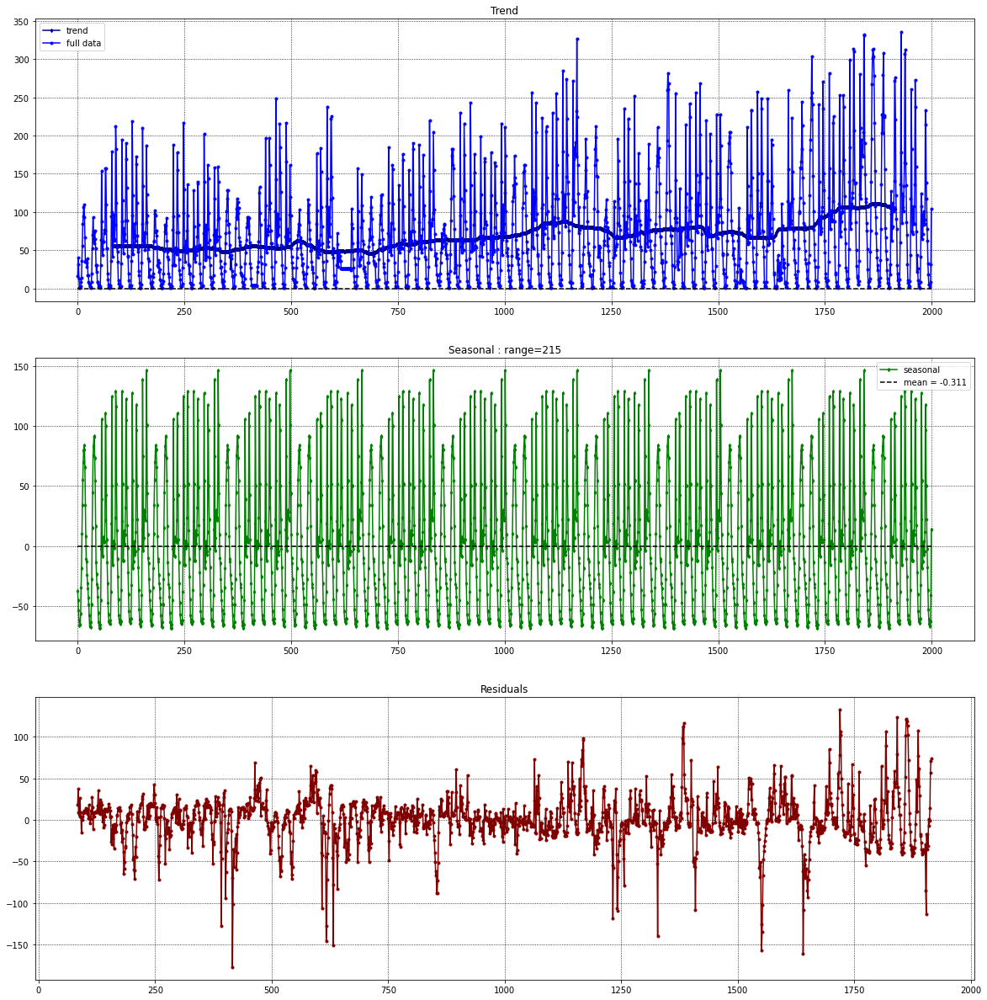

In [ ]:
decomposition = seasonal_decompose(y[:2000], model='additive', period=24*7)



plt.subplots(3, 1, figsize=(20, 21))

plt.subplot(3, 1, 1)
plt.plot(decomposition.trend,
         '-d', color='navy', markersize=3, label='trend')
plt.plot(data_target[['cnt']][:2000], '-bo', markersize=3, label='full data')
# plt.plot(decomposition.trend.index[0], 0)
plt.plot([decomposition.trend.index[0], decomposition.trend.index[-1]], [0, 0], '--k')
plt.legend()
plt.grid(linestyle=':', color='k')
plt.title("Trend")


plt.subplot(3, 1, 2)
plt.plot(decomposition.seasonal,
         '-gd', markersize=3, label='seasonal')
plt.plot([decomposition.seasonal.index[0], decomposition.seasonal.index[-1]],
         decomposition.seasonal.mean()*np.array([1, 1]), '--k',
         label=f"mean = {decomposition.seasonal.mean():.3g}")
plt.legend()
plt.grid(linestyle=':', color='k')
plt.title(f"Seasonal : range={(decomposition.seasonal.max() - decomposition.seasonal.min()):.3g}")


plt.subplot(3, 1, 3)
plt.plot(decomposition.resid, '-o', color='maroon', markersize=3)
plt.grid(linestyle=':', color='k')
plt.title("Residuals")
plt.show()

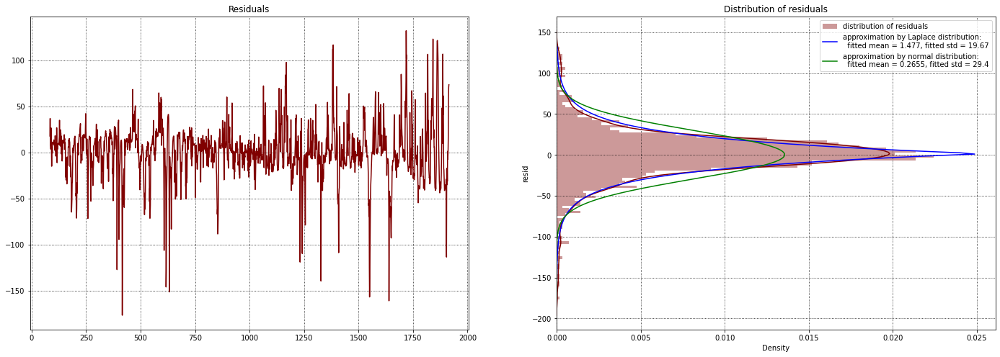

In [ ]:
resid = decomposition.resid
residual_plot(resid)

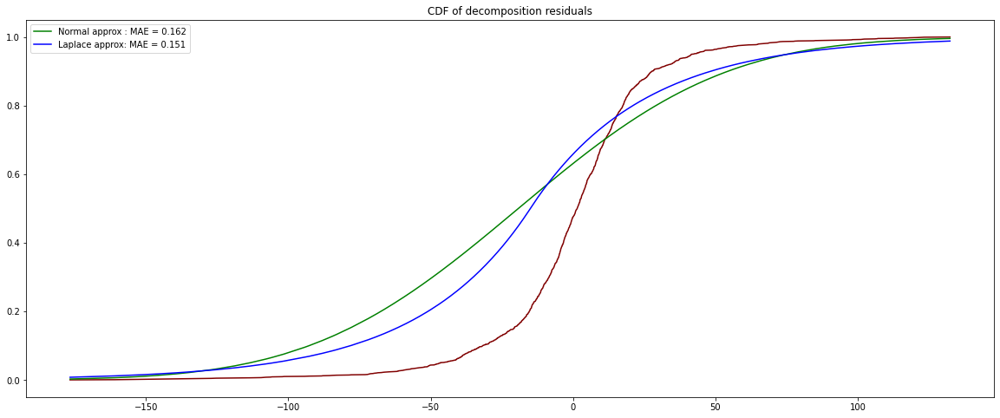

MAE_Gaussian/MAE_Laplace = 1.07.


In [ ]:
ecdf_resid_instance = ECDF(resid.dropna())
resid_arr = resid.dropna().sort_values().values
ecdf_resid = ecdf_resid_instance(resid_arr)


cdf_norm = st.norm.cdf(resid_arr, loc=loc_norm, scale=scale_norm)
cdf_laplace = st.laplace.cdf(resid_arr, loc=loc_laplace, scale=scale_laplace)


mae_norm = mean_absolute_error(ecdf_resid, cdf_norm)
mae_laplace = mean_absolute_error(ecdf_resid, cdf_laplace)


plt.subplots(1, 1, figsize=(20, 8))
plt.plot(resid_arr, ecdf_resid, '-', color='maroon')
plt.plot(resid_arr, cdf_norm, '-g',
         label=f"Normal approx : MAE = {mae_norm:.3g}")
plt.plot(resid_arr, cdf_laplace, '-b',
         label=f"Laplace approx: MAE = {mae_laplace:.3g}")
plt.legend()
plt.title("CDF of decomposition residuals")
plt.show()

print(f"MAE_Gaussian/MAE_Laplace = {mae_norm/mae_laplace:.3g}.")

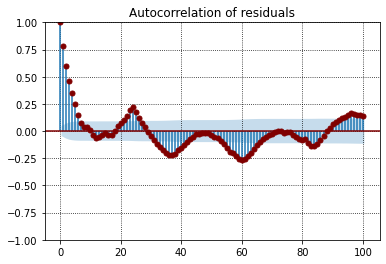

In [ ]:
lags = 100

plot_acf(resid.dropna(), lags=lags, color='maroon',
         title='Autocorrelation of residuals');
plt.grid(linestyle=':', color='k')
plt.show()

This residuals clearly have periodicity of 24 hours.

In [ ]:
trend = decomposition.trend.dropna()

In [ ]:
alpha = 0.01


print(f"alpha = {alpha}\n")
# ADF Test
print("==== Augmented Dickey–Fuller (Null hypothesis - The process is non-stationary): ")
result = adfuller(trend.dropna(), autolag='AIC')
print(f'ADF Statistic: {result[0]:.4g}')
print(f'p-value: {result[1]:.4g}')
if result[1] < alpha:
    print("The process is stationary.\n")
else:
    print("The process is non-stationary.\n")

alpha = 0.01

==== Augmented Dickey–Fuller (Null hypothesis - The process is non-stationary): 
ADF Statistic: -0.712
p-value: 0.8436
The process is non-stationary.



In [ ]:
print('==== Kwiatkowski–Phillips–Schmidt–Shin (KPSS) test (Null hypothesis - The process is stationary):')
# kpss test
kpsstest = kpss(trend.dropna(), regression='c')
print(f"KPSS Statistic = {kpsstest[0]:.4g}")
print(f"p-value = {kpsstest[1]:.4g}")
if kpsstest[1] <= alpha:
    print("The process is non-stationary.\n")
else:
    print("The process is stationary.\n")

==== Kwiatkowski–Phillips–Schmidt–Shin (KPSS) test (Null hypothesis - The process is stationary):
KPSS Statistic = 4.876
p-value = 0.01
The process is non-stationary.



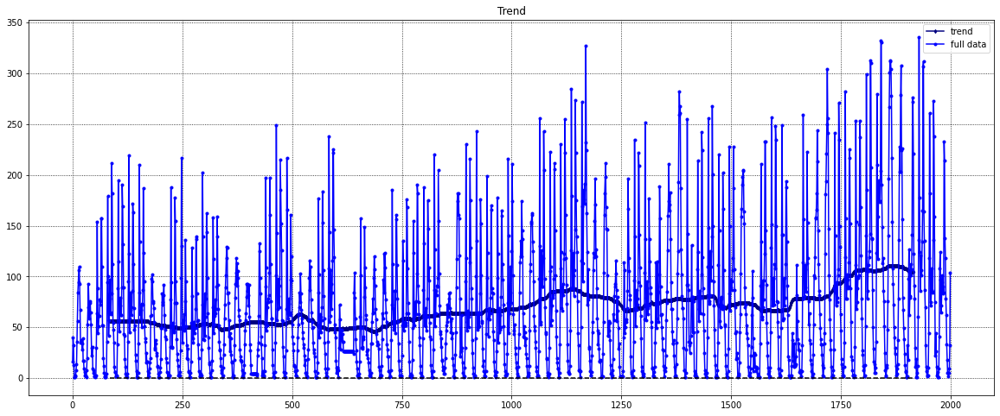

In [ ]:
plt.subplots(1, 1, figsize=(20, 8))

plt.plot(trend[:1976], '-d', color='navy', markersize=3, label='trend')
plt.plot(data_target[['cnt']][:2000], '-bo', markersize=3, label='full data')
plt.plot([trend.index[0], trend.index[-1]], [0, 0], '--k')
plt.legend()
plt.grid(linestyle=':', color='k')
plt.title("Trend")
plt.show()

Text(0.5, 1.0, '1st derivative of trend')

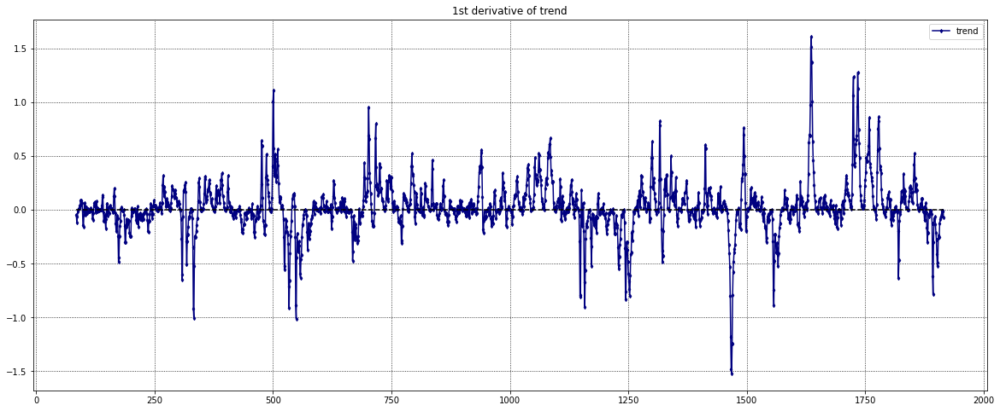

In [ ]:
trend_diff = trend.diff().dropna()

plt.subplots(1, 1, figsize=(20, 8))

plt.plot(trend_diff, '-d', color='navy', markersize=3, label='trend')
plt.plot([trend_diff.index[0], trend_diff.index[-1]], [0, 0], '--k')
plt.legend()
plt.grid(linestyle=':', color='k')
plt.title("1st derivative of trend")

In [ ]:
alpha = 0.01


print(f"alpha = {alpha}\n")
# ADF Test
print("==== Augmented Dickey–Fuller (Null hypothesis - The process is non-stationary): ")
result = adfuller(trend_diff, autolag='AIC')
print(f'ADF Statistic: {result[0]:.4g}')
print(f'p-value: {result[1]:.4g}')
if result[1] < alpha:
    print("The process is stationary.\n")
else:
    print("The process is non-stationary.\n")

alpha = 0.01

==== Augmented Dickey–Fuller (Null hypothesis - The process is non-stationary): 
ADF Statistic: -5.883
p-value: 3.052e-07
The process is stationary.



In [ ]:
print('==== Kwiatkowski–Phillips–Schmidt–Shin (KPSS) test (Null hypothesis - The process is stationary):')
# kpss test
kpsstest = kpss(trend_diff, regression='c')
print(f"KPSS Statistic = {kpsstest[0]:.4g}")
print(f"p-value = {kpsstest[1]:.4g}")
if kpsstest[1] <= alpha:
    print("The process is non-stationary.\n")
else:
    print("The process is stationary.\n")

==== Kwiatkowski–Phillips–Schmidt–Shin (KPSS) test (Null hypothesis - The process is stationary):
KPSS Statistic = 0.2093
p-value = 0.1
The process is stationary.



### Differentiating the Target

In [ ]:
import datetime

In [ ]:
# data_target["time"] = data_target["hr"].apply(lambda x: datetime.datetime.strptime(f'{x}:30', '%H:%M').time())
# data_target["datetime"] = pd.to_datetime(data_target['dteday'].astype(str) + ' ' + data_target['time'].astype(str))
data_target = data
data_target = data_target.set_index(['datetime'])
data_target = data_target["cnt"]

In [ ]:
data_target

datetime
2011-01-01 00:30:00     16.0
2011-01-01 01:30:00     40.0
2011-01-01 02:30:00     32.0
2011-01-01 03:30:00     13.0
2011-01-01 04:30:00      1.0
                       ...  
2012-12-31 19:30:00    119.0
2012-12-31 20:30:00     89.0
2012-12-31 21:30:00     90.0
2012-12-31 22:30:00     61.0
2012-12-31 23:30:00     49.0
Name: cnt, Length: 17544, dtype: float64

In [ ]:
y = data_target.diff().dropna()

In [ ]:
y

datetime
2011-01-01 01:30:00    24.0
2011-01-01 02:30:00    -8.0
2011-01-01 03:30:00   -19.0
2011-01-01 04:30:00   -12.0
2011-01-01 05:30:00     0.0
                       ... 
2012-12-31 19:30:00    -3.0
2012-12-31 20:30:00   -30.0
2012-12-31 21:30:00     1.0
2012-12-31 22:30:00   -29.0
2012-12-31 23:30:00   -12.0
Name: cnt, Length: 17543, dtype: float64

In [ ]:
alpha = 0.05
print(f"alpha = {alpha}\n")

# ADF Test
print("==== Augmented Dickey–Fuller (Null hypothesis - The process is non-stationary): ")
result = adfuller(y, autolag='AIC')
print(f'ADF Statistic: {result[0]}')
print(f'p-value: {result[1]}')
if result[1] < alpha:
    print("The process is stationary.\n")
else:
    print("The process is non-stationary.\n")

alpha = 0.05

==== Augmented Dickey–Fuller (Null hypothesis - The process is non-stationary): 
ADF Statistic: -29.74457867639026
p-value: 0.0
The process is stationary.



In [ ]:
print('==== Kwiatkowski–Phillips–Schmidt–Shin (KPSS) test (Null hypothesis - The process is stationary):')
# kpss test
kpsstest = kpss(y, regression='c')
print("KPSS Statistic = " + str(kpsstest[0]))
print( "p-value = " +str(kpsstest[1]))
if kpsstest[1] < alpha:
    print("The process is non-stationary.\n")
else:
    print("The process is stationary.\n")

==== Kwiatkowski–Phillips–Schmidt–Shin (KPSS) test (Null hypothesis - The process is stationary):
KPSS Statistic = 0.012347901221505832
p-value = 0.1
The process is stationary.



After first differentiation we got a stationary process that is proven by both tests. Thus later in ARIMA model the optimal d hyperparameter value would be 1. As long as we got a stationary process there is no need to further differentiate.

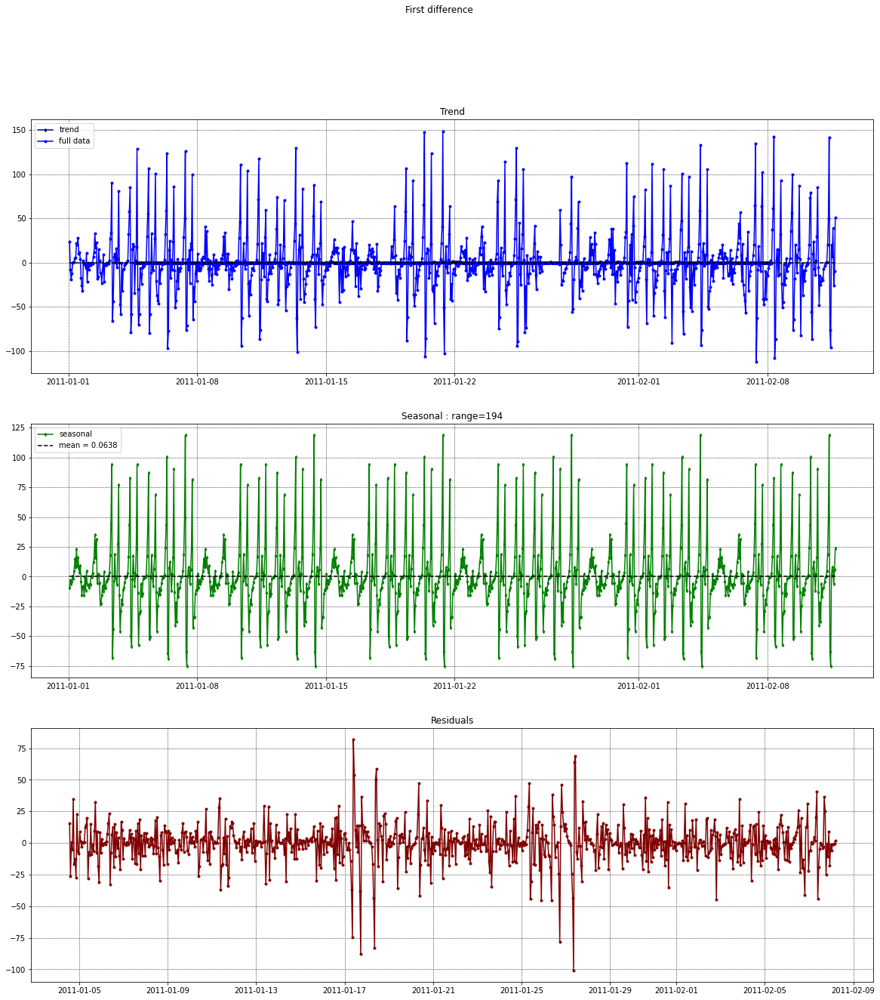

In [ ]:
decomposition = seasonal_decompose(y[:1000], model='additive', period=24*7)



plt.subplots(3, 1, figsize=(20, 21))
plt.suptitle("First difference")

plt.subplot(3, 1, 1)
plt.plot(decomposition.trend,
         '-d', color='navy', markersize=3, label='trend')
plt.plot(y[:1000], '-bo', markersize=3, label='full data')
# plt.plot(decomposition.trend.index[0], 0)
plt.plot([decomposition.trend.index[0], decomposition.trend.index[-1]], [0, 0], '--k')
plt.legend()
plt.grid(linestyle=':', color='k')
plt.title("Trend")


plt.subplot(3, 1, 2)
plt.plot(decomposition.seasonal,
         '-gd', markersize=3, label='seasonal')
plt.plot([decomposition.seasonal.index[0], decomposition.seasonal.index[-1]],
         decomposition.seasonal.mean()*np.array([1, 1]), '--k',
         label=f"mean = {decomposition.seasonal.mean():.3g}")
plt.legend()
plt.grid(linestyle=':', color='k')
plt.title(f"Seasonal : range={(decomposition.seasonal.max() - decomposition.seasonal.min()):.3g}")


plt.subplot(3, 1, 3)
plt.plot(decomposition.resid, '-o', color='maroon', markersize=3)
plt.grid(linestyle=':', color='k')
plt.title("Residuals")
plt.show()

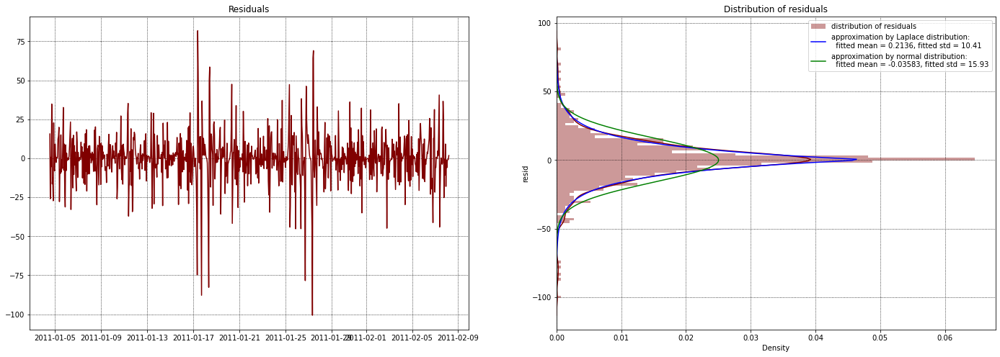

In [ ]:
resid = decomposition.resid
color = 'maroon'

plt.subplots(1, 2, figsize=(24, 8))

plt.subplot(1, 2, 1)
plt.plot(resid, '-', color=color)
plt.grid(linestyle=':', color='k')
plt.title("Residuals")



x_fit = np.linspace(resid.min(), resid.max(), 201)
loc_laplace, scale_laplace = st.laplace.fit(resid.dropna())
loc_norm, scale_norm = st.norm.fit(resid.dropna())
y_fit_laplace = st.laplace.pdf(x_fit, loc_laplace, scale_laplace)
y_fit_norm = st.norm.pdf(x_fit, loc_norm, scale_norm)

plt.subplot(1, 2, 2)
sns.distplot(resid, color=color, bins=100, vertical=True, label="distribution of residuals")
plt.plot(y_fit_laplace, x_fit, '-b',
        label=f"approximation by Laplace distribution:\n  fitted mean = {loc_laplace:.4g}, fitted std = {scale_laplace:.4g}")
plt.plot(y_fit_norm, x_fit, '-g',
        label=f"approximation by normal distribution:\n  fitted mean = {loc_norm:.4g}, fitted std = {scale_norm:.4g}")
plt.legend()
plt.title("Distribution of residuals")
plt.grid(linestyle=':', color='k')

plt.show()

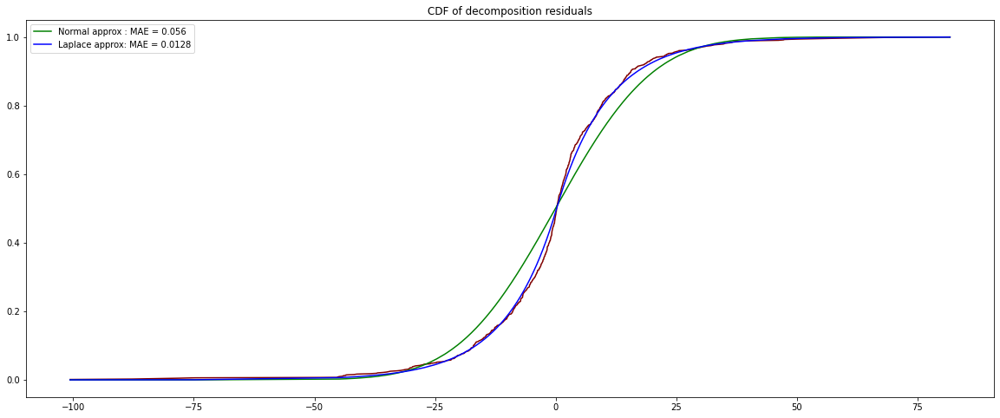

MAE_Gaussian/MAE_Laplace = 4.39.


In [ ]:
ecdf_resid_instance = ECDF(resid.dropna())
resid_arr = resid.dropna().sort_values().values
ecdf_resid = ecdf_resid_instance(resid_arr)


cdf_norm = st.norm.cdf(resid_arr, loc=loc_norm, scale=scale_norm)
cdf_laplace = st.laplace.cdf(resid_arr, loc=loc_laplace, scale=scale_laplace)


mae_norm = mean_absolute_error(ecdf_resid, cdf_norm)
mae_laplace = mean_absolute_error(ecdf_resid, cdf_laplace)


plt.subplots(1, 1, figsize=(20, 8))
plt.plot(resid_arr, ecdf_resid, '-', color='maroon')
plt.plot(resid_arr, cdf_norm, '-g',
         label=f"Normal approx : MAE = {mae_norm:.3g}")
plt.plot(resid_arr, cdf_laplace, '-b',
         label=f"Laplace approx: MAE = {mae_laplace:.3g}")
plt.legend()
plt.title("CDF of decomposition residuals")
plt.show()

print(f"MAE_Gaussian/MAE_Laplace = {mae_norm/mae_laplace:.3g}.")

Closer to Laplace approximation. So if we could choose the loss function, we should use the MAE.

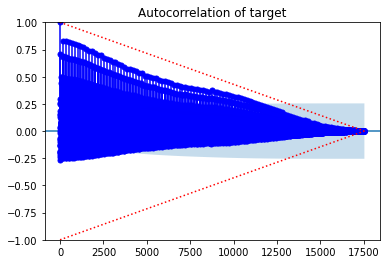

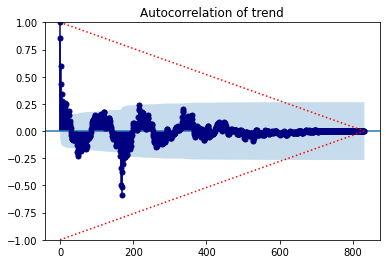

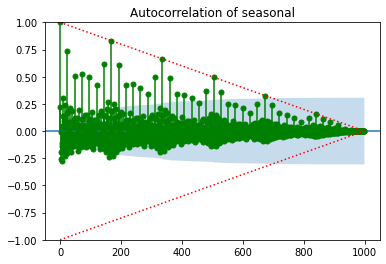

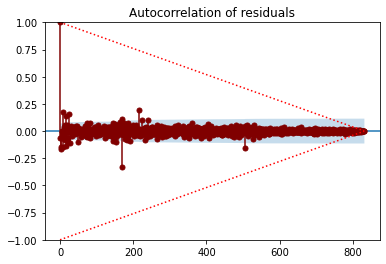

In [ ]:
N = len(y)
k = np.arange(0, N)
plot_acf(y,
         lags=N-1,
         vlines_kwargs={'color' : 'b'},
         markerfacecolor='b', markeredgecolor='b',
         title='Autocorrelation of target');
plt.plot(k, 1-k/N, ':r')
plt.plot(k, -1+k/N, ':r')

trend = decomposition.trend.dropna()
N = len(trend)
k = np.arange(0, N)
plot_acf(trend,
         lags=N-1,
         vlines_kwargs={'color' : 'navy'},
         markerfacecolor='navy', markeredgecolor='navy',
         title='Autocorrelation of trend');
plt.plot(k, 1-k/N, ':r')
plt.plot(k, -1+k/N, ':r')


seasonal = decomposition.seasonal
N = len(seasonal)
k = np.arange(0, N)
plot_acf(seasonal,
         lags=N-1,
         vlines_kwargs={'color' : 'g'},
         markerfacecolor='g', markeredgecolor='g',
         title='Autocorrelation of seasonal');
plt.plot(k, 1-k/N, ':r')
plt.plot(k, -1+k/N, ':r')


N = len(resid.dropna())
k = np.arange(0, N)
plot_acf(resid.dropna(),
         lags=N-1,
         vlines_kwargs={'color' : 'maroon'},
         markerfacecolor='maroon', markeredgecolor='maroon',
         title='Autocorrelation of residuals');
plt.plot(k, 1-k/N, ':r')
plt.plot(k, -1+k/N, ':r')


plt.show()

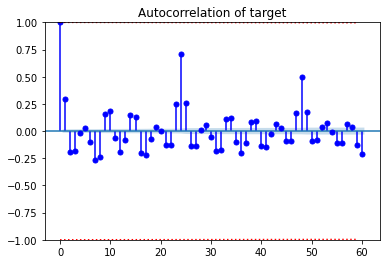

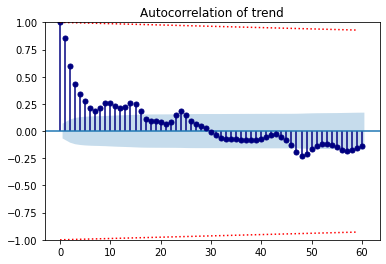

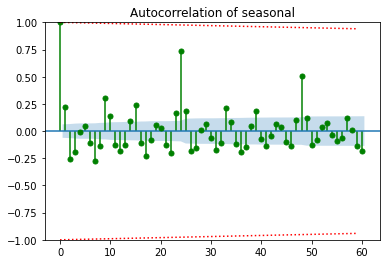

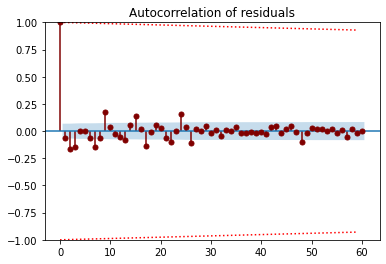

In [ ]:
lags = 60

N = len(y)
k = np.arange(0, lags)
plot_acf(y,
         lags=lags,
         vlines_kwargs={'color' : 'b'},
         markerfacecolor='b', markeredgecolor='b',
         title='Autocorrelation of target');
plt.plot(k, 1-k/N, ':r')
plt.plot(k, -1+k/N, ':r')


N = len(trend)
plot_acf(trend,
         lags=lags,
         vlines_kwargs={'color' : 'navy'},
         markerfacecolor='navy', markeredgecolor='navy',
         title='Autocorrelation of trend');
plt.plot(k, 1-k/N, ':r')
plt.plot(k, -1+k/N, ':r')


seasonal = decomposition.seasonal
N = len(seasonal)
plot_acf(seasonal,
         lags=lags,
         vlines_kwargs={'color' : 'g'},
         markerfacecolor='g', markeredgecolor='g',
         title='Autocorrelation of seasonal');
plt.plot(k, 1-k/N, ':r')
plt.plot(k, -1+k/N, ':r')


N = len(resid.dropna())
plot_acf(resid.dropna(),
         lags=lags,
         vlines_kwargs={'color' : 'maroon'},
         markerfacecolor='maroon', markeredgecolor='maroon',
         title='Autocorrelation of residuals');
plt.plot(k, 1-k/N, ':r')
plt.plot(k, -1+k/N, ':r')


plt.show()

Here we can see that autocorrelation is quite high at lag 24, this is how I would choose the q value for ARIMA model.

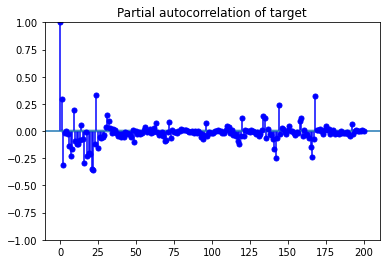

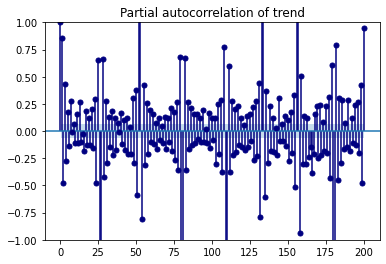

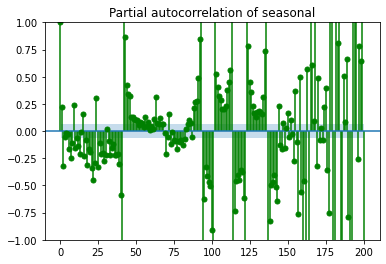

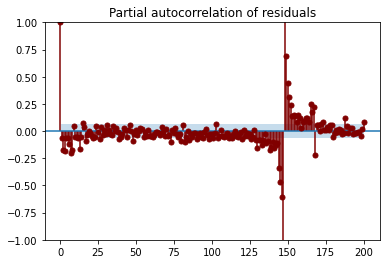

In [ ]:
lags = 200

plot_pacf(y,
         lags=lags,
         vlines_kwargs={'color' : 'b'},
         markerfacecolor='b', markeredgecolor='b',
         title='Partial autocorrelation of target');


plot_pacf(trend.dropna(),
         lags=lags,
         vlines_kwargs={'color' : 'navy'},
         markerfacecolor='navy', markeredgecolor='navy',
         title='Partial autocorrelation of trend');


seasonal = decomposition.seasonal
plot_pacf(seasonal,
         lags=lags,
         vlines_kwargs={'color' : 'g'},
         markerfacecolor='g', markeredgecolor='g',
         title='Partial autocorrelation of seasonal');


plot_pacf(resid.dropna(),
         lags=lags,
         vlines_kwargs={'color' : 'maroon'},
         markerfacecolor='maroon', markeredgecolor='maroon',
         title='Partial autocorrelation of residuals');


plt.show()

From partial autocorrelation I think the furthest important point is 168 indicating weekly seasonality, so for the ARIMA hyperparameter p I believe the value 168 would be optimal.

# 3. Preprocessing

## 3.1 Feature Engineering

### Adding seasonal features

In [ ]:
if "dteday" in data.columns:
  data = data.drop(["dteday"], axis=1)
  data = data.drop(["datetime"], axis=1)

In [ ]:
y_cnt = data["cnt"]
y_reg = data["registered"]
y_cas = data["casual"]
targets = ["cnt", "registered", "casual"]
X = data.drop(targets, axis=1)

In [ ]:
def sin_season_year(x):
	return np.sin((x / 4) * 2 * np.pi)
def sin_day_week(x):
	return np.sin((x / 7) * 2 * np.pi)
def sin_hour(x):
	decimal.getcontext().prec = 6
	tmp = decimal.getcontext().create_decimal(1.357e-05)
	return round((np.sin((x / 24) * 2 * np.pi)), 6)

In [ ]:
X["season_year_sin"] = X["season"].apply(sin_season_year)
X["day_week_sin"] = X["weekday"].apply(sin_day_week)
X["hour_sin"] = X["hr"].apply(sin_hour)
print(X[["season_year_sin", "day_week_sin", "hour_sin"]])

       season_year_sin  day_week_sin  hour_sin
0                  1.0     -0.781831  0.000000
1                  1.0     -0.781831  0.258819
2                  1.0     -0.781831  0.500000
3                  1.0     -0.781831  0.707107
4                  1.0     -0.781831  0.866025
...                ...           ...       ...
17539              1.0      0.781831 -0.965926
17540              1.0      0.781831 -0.866025
17541              1.0      0.781831 -0.707107
17542              1.0      0.781831 -0.500000
17543              1.0      0.781831 -0.258819

[17544 rows x 3 columns]


In [ ]:
# initial_columns = list(X_poly.columns)
# poly = PolynomialFeatures(2)
# X_poly = poly.fit_transform(X_poly)
# poly_columns = poly.get_feature_names_out(initial_columns)
# X_poly = pd.DataFrame(X_poly, columns=poly_columns)

In [ ]:
# if "season_year_sin" in initial_columns:
#     initial_columns.remove("season_year_sin")
#     initial_columns.remove("day_week_sin")
#     initial_columns.remove("hour_sin")

In [ ]:
# for col in initial_columns:
#   X_poly[f"{col}_log"] = X_poly[col].apply(lambda x: math.log(1+x,2))
# for col in initial_columns:
#   X_poly[f"{col}_log"] = X_poly[col].apply(lambda x: math.sqrt(x))

Here I tried to create so feature based on date information. Sadly those features did not help the regular regression model to improve the perforformance.

### Add a window function as a feature

In [ ]:
X["window_weather"] = X["weathersit"].rolling(window=5).mean()
X["window_temp"] = X["temp"].rolling(window=5).mean()

## 3.2 Separation of Test from the Dataset

In [ ]:
# y_cnt = data["cnt"]
# y_reg = data["registered"]
# y_cas = data["casual"]
# targets = ["cnt", "registered", "casual"]
# X = data.drop(targets, axis=1)
# # X_poly = X.copy()

In [ ]:
y_train = data["cnt"][:-31*24]
y_test = data["cnt"][-31*24:]

In [ ]:
X_train = X[:-31*24]
X_test = X[-31*24:]

In [ ]:
# X_train_poly = X_poly[((X_poly["yr"]==1) & (X_poly["mnth"]==12)) == False]
# X_test_poly = X_poly[(X_poly["yr"]==1) & (X_poly["mnth"]==12)]

In [ ]:
print(len(X_test))

744


## 3.3 Normalization

In [ ]:
features_to_normalize = X_train.columns

In [ ]:
set_config(transform_output="pandas")
sc_pipe = Pipeline([
    ('scaler', StandardScaler())
])

pipe = ColumnTransformer(transformers=[
    ("sc", sc_pipe, features_to_normalize),
])

In [ ]:
X_train_tr = pipe.fit_transform(X_train)
X_test_tr = pipe.transform(X_test)

In [ ]:
# poly_features_to_normalize = X_poly.columns

In [ ]:
# set_config(transform_output="pandas")
# sc_pipe = Pipeline([
#     ('scaler', MinMaxScaler())
# ])

# pipe = ColumnTransformer(transformers=[
#     ("sc", sc_pipe, poly_features_to_normalize),
# ])

In [ ]:
# X_train_poly_tr = pipe.fit_transform(X_train_poly)
# X_test_poly_tr = pipe.transform(X_test_poly)

In [ ]:
print(len(X_train_tr))
print(len(y_train))

16800
16800


# 4. Regression Model

In [ ]:
def print_reg_metrics(true_values_train, predicted_values_train, featurecount=1, cval=1):
    n = len(true_values_train)/cval
    r2 = metrics.r2_score(true_values_train, predicted_values_train)
    r2_adj = 1-(1-r2)*(n-1)/(n-featurecount)
    mae = metrics.mean_absolute_error(true_values_train, predicted_values_train)
    mse = metrics.mean_squared_error(true_values_train, predicted_values_train)
    rmse = np.sqrt(metrics.mean_squared_error(true_values_train, predicted_values_train))
    print(
        f"R2 score: {r2}",
        f"\nR2 Adjusted: {r2_adj}",
        f"\nRMS Error: {rmse}",
        f"\nMS Error: {mse}",
        f"\nMA Error: {mae}"
          )

In [ ]:
def regression_cross_val_score(X_cval, y_cval, regressor = LinearRegression()):
    # Variables for average classification report
    originalclass_lr = []
    predictedclass_lr = []

    #Make our custom score
    def classification_report_with_r2_score(y_true, y_pred):
        originalclass_lr.extend(y_true)
        predictedclass_lr.extend(y_pred)
        return r2_score(y_true, y_pred) # return accuracy score

    outer_cv = KFold(n_splits=10, shuffle=True, random_state=seed)

    # Nested CV with parameter optimization
    nested_score = cross_val_score(regressor, X=X_cval, y=y_cval, cv=outer_cv, scoring=make_scorer(classification_report_with_r2_score))

    # Average values in classification report for all folds in a K-fold Cross-validation
    print_reg_metrics(originalclass_lr, predictedclass_lr, X_cval.shape[1], cval=10)

Here I will use the best Model of Regression, just for comparison.

In [ ]:
cat_reg = CatBoostRegressor(verbose=False, random_state=seed)
cat_reg.fit(X_train_tr, y_train)
predictions = cat_reg.predict(X_test_tr)

print_reg_metrics(y_test, predictions, X_train_tr.shape[1])

R2 score: 0.7979380434934282 
R2 Adjusted: 0.7934910128137788 
RMS Error: 74.06867105221494 
MS Error: 5486.168031441223 
MA Error: 46.52420082760473


# 5. Time Series Models

## 5.1 Train Test Split

In [ ]:
N_test = 31*24
print(f"We have {len(data_target)} points totally and last {N_test} test points amongst them.")

train_ind = np.arange(len(data_target)-N_test)
test_ind = np.arange(len(data_target)-N_test, len(data_target))

train = data_target[:len(data_target)-N_test]
test = data_target[len(data_target)-N_test:len(data_target)]

We have 17544 points totally and last 744 test points amongst them.


## 5.2 Basic Model

In [ ]:
decomposition = seasonal_decompose(train, model='additive', period=24*7)

trend = decomposition.trend
seasonal = decomposition.seasonal

In [ ]:
# decomposition_trend = seasonal_decompose(trend_big.dropna(), model='additive', period=24)

# trend = decomposition_trend.trend
# seasonal_trend = decomposition_trend.seasonal

In [ ]:
def seasonal_component(ind, period=24*7, seasonal=seasonal):
    seasonal_unit = seasonal[:period].values
    ind_norm = ind % period

    return seasonal_unit[ind_norm]

[-9.31724911e-14  3.17954236e-09 -3.52776062e-05  1.50345657e-01
 -4.04084617e+01]


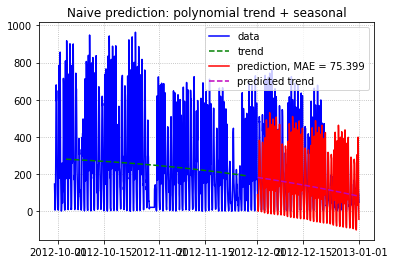

In [ ]:
X_train = trend.reset_index(drop=True).dropna()
X_train_ind = np.array(X_train.index)
y_train_trend = X_train.values

poly_coeff = np.polyfit(X_train_ind, y_train_trend, 4)
print(poly_coeff)
trend_pred = np.polyval(poly_coeff, test_ind)
# print(trend_pred)
pred = trend_pred + seasonal_component(test_ind, period=24*7, seasonal=seasonal)


trend_pred_train = np.polyval(poly_coeff, X_train_ind)

mae_naive = mean_absolute_error(test, pred)

plt.plot(data_target[len(data_target)-3*N_test:].index, data_target[len(data_target)-3*N_test:], '-b', label="data")
plt.plot(trend[X_train.index][len(data_target)-3*N_test:].index, trend_pred_train[len(data_target)-3*N_test:], '--g', label="trend")

plt.plot(test.index, pred, '-r', label=f"prediction, MAE = {mae_naive:0.3f}")
plt.plot(test.index, trend_pred, '--m', label=f"predicted trend")
plt.grid(linestyle=':')
plt.legend()
plt.title("Naive prediction: polynomial trend + seasonal")
plt.show()

I noticed that the trend is a bit complicated function, so started experimenting with higher degrees of polynomials to predict the trend and the power of 4 worked the best.

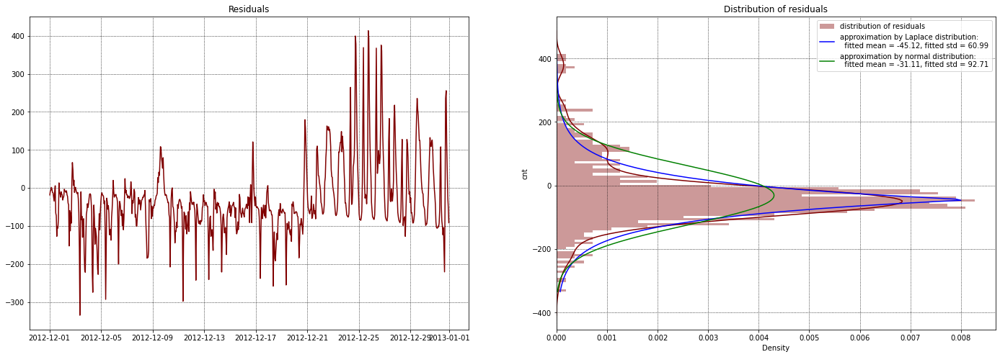

In [ ]:
resid = pred - test
residual_plot(resid)

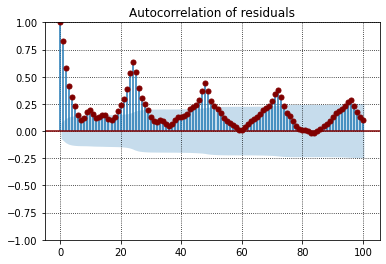

In [ ]:
lags = 100

plot_acf(resid.dropna(), lags=lags, color='maroon',
         title='Autocorrelation of residuals');
plt.grid(linestyle=':', color='k')
plt.show()

We can see there is still autocorrelation with lag 24 periods, the the residuals are not a white noise.

## 5.3 Multiple Seasonalities

In [ ]:
decomposition = seasonal_decompose(train, model='additive', period=24*7)

trend = decomposition.trend
seasonal = decomposition.seasonal

In [ ]:
train_second = train - seasonal
decomposition_second = seasonal_decompose(train_second.dropna(), model='additive', period=24)

trend_second = decomposition_second.trend
seasonal_second = decomposition_second.seasonal

In [ ]:
# train_third = train_second - seasonal
# decomposition_third = seasonal_decompose(train_third.dropna(), model='multiplicative', period=24*365.25)

# trend_third = decomposition_third.trend
# seasonal_third = decomposition_third.seasonal

Yearly decomposition was impossible as we do not have enough data for 2 complete circles. Despite I believe there was yearly seasonality in the data. I think we could add a bit more data from the past and we would be able to extract yearly decomposition. I could also learn it on the whole data, but I believe it will be a data leakage.

[-9.00241167e-14  3.06419918e-09 -3.38497264e-05  1.43594784e-01
 -3.10383255e+01]


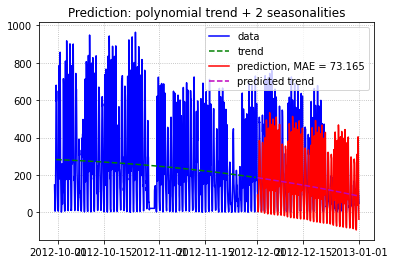

In [ ]:
X_train = trend_second.reset_index(drop=True).dropna()
X_train_ind = np.array(X_train.index)
y_train_trend = X_train.values

poly_coeff = np.polyfit(X_train_ind, y_train_trend, 4)
print(poly_coeff)
trend_pred = np.polyval(poly_coeff, test_ind)
pred = trend_pred + seasonal_component(test_ind, period=24, seasonal=seasonal_second) + seasonal_component(test_ind, period=24*7, seasonal=seasonal)
      # + seasonal_component(test_ind, period=24*365, seasonal=seasonal_third)


trend_pred_train = np.polyval(poly_coeff, X_train_ind)
mae_naive = mean_absolute_error(test, pred)

plt.plot(data_target[len(data_target)-3*N_test:].index, data_target[len(data_target)-3*N_test:], '-b', label="data")
plt.plot(trend[X_train.index][len(data_target)-3*N_test:].index, trend_pred_train[len(data_target)-3*N_test:], '--g', label="trend")

plt.plot(test.index, pred, '-r', label=f"prediction, MAE = {mae_naive:0.3f}")
plt.plot(test.index, trend_pred, '--m', label=f"predicted trend")
plt.grid(linestyle=':')
plt.legend()
plt.title("Prediction: polynomial trend + 2 seasonalities")
plt.show()

After trying different combinations of decompositions with "multiplicative" approach as well, but the results got worse. In this case adding another layer of daily seasonality improved a little the model in comparison to the one decomposition model. As we had daily periodicity in the residuals before. I believe it is the result of the fact that 2 periodicities are multipliers of each other so the second decomposition does not add much value. And in case of double 'additive' decompositions the results were just identical, proving my point.

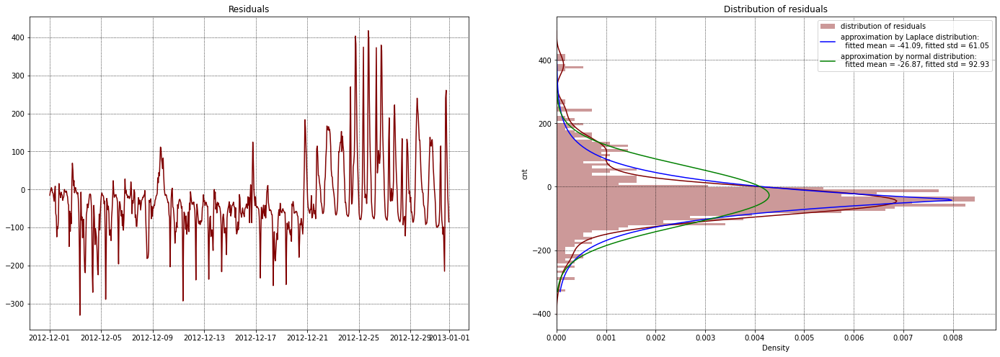

In [ ]:
resid = pred - test
residual_plot(resid)

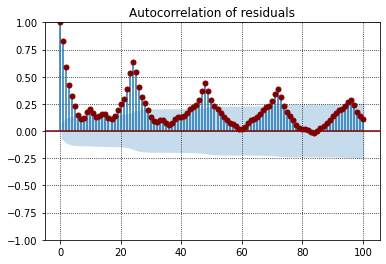

In [ ]:
lags = 100

plot_acf(resid.dropna(), lags=lags, color='maroon',
         title='Autocorrelation of residuals');
plt.grid(linestyle=':', color='k')
plt.show()

We still have the daily periodicity, and the residuals are not a white noise.

## 5.4 Exogenous Features

In [ ]:
poly_coeff = np.polyfit(X_train_ind, y_train_trend, 4)
print(poly_coeff)
trend_pred = np.polyval(poly_coeff, test_ind)
test_pred = trend_pred + seasonal_component(test_ind, period=24, seasonal=seasonal_second) + seasonal_component(test_ind, period=24*7, seasonal=seasonal)
train_trend_pred = np.polyval(poly_coeff, train_ind)
train_pred = train_trend_pred + seasonal_component(train_ind, period=24*7, seasonal=seasonal)
X_train_tr["ts_preds"] = train_pred
X_test_tr["ts_preds"] = test_pred

[-9.00241167e-14  3.06419918e-09 -3.38497264e-05  1.43594784e-01
 -3.10383255e+01]


In [ ]:
print(len(train_pred))

16800


In [ ]:
cat_reg = CatBoostRegressor(verbose=False, random_state=seed)
cat_reg.fit(X_train_tr, y_train)
predictions = cat_reg.predict(X_test_tr)

print_reg_metrics(y_test, predictions, X_train_tr.shape[1])

R2 score: 0.8649303517831541 
R2 Adjusted: 0.8617675638772501 
RMS Error: 60.55794929968289 
MS Error: 3667.2652233829635 
MA Error: 42.083089408306094


As we can see, we improved the score of our non time series model by adding the predictions of the endogenous model of time series.

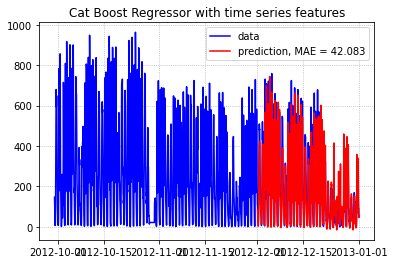

In [ ]:
mae_naive = mean_absolute_error(test, predictions)

plt.plot(data_target[len(data_target)-3*N_test:].index, data_target[len(data_target)-3*N_test:], '-b', label="data")
# plt.plot(trend[X_train.index][len(data_target)-3*N_test:].index, trend_pred_train[len(data_target)-3*N_test:], '--g', label="polynomial trend")

plt.plot(test.index, predictions, '-r', label=f"prediction, MAE = {mae_naive:0.3f}")
# plt.plot(test.index, trend_pred, '--m', label=f"predicted trend")
plt.grid(linestyle=':')
plt.legend()
plt.title("Cat Boost Regressor with time series features")
plt.show()

The model with exogenous variables did a much better job. We have a very low MAE score, and even visually we can see that we got a closer match.

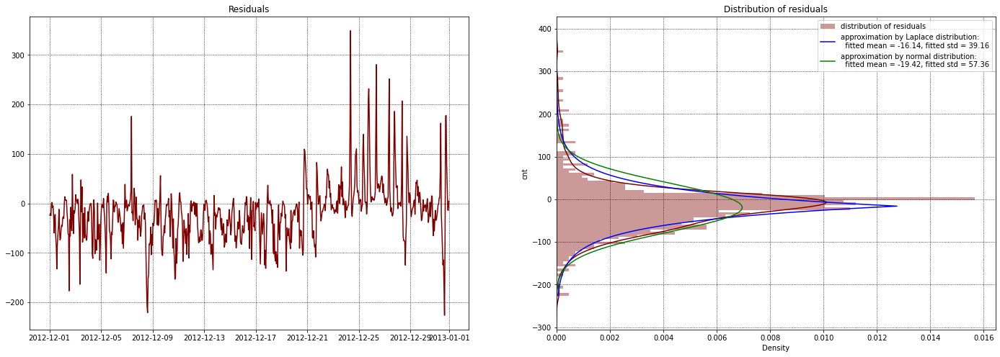

In [ ]:
resid = predictions - test
residual_plot(resid)

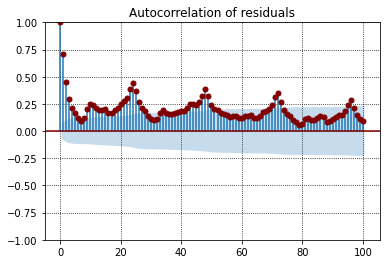

In [ ]:
lags = 100

plot_acf(resid.dropna(), lags=lags, color='maroon',
         title='Autocorrelation of residuals');
plt.grid(linestyle=':', color='k')
plt.show()

With this model we got a little closer to have white noise residuals, but still there is autocorrelation with daily periodicity inbetweeen the residuals.

## 5.5 ARIMA Model

### With Hyperparameters Driven from EDA

In [ ]:
q, d, p = [24], 1, [24]

arima_model = ARIMA(train, order=(p, d, q)).fit()
print()
print(f"ARIMA model ({p}, {d}, {q}):")
print(arima_model.params)

prediction_arima_train = arima_model.predict(train.index[0], train.index[-1])
prediction_arima_test = arima_model.predict(test_ind[0], test_ind[-1])

mae_arima = mean_absolute_error(y_true=test, y_pred=prediction_arima_test)


ARIMA model ([24], 1, [24]):
ar.L24       0.717165
ma.L24      -0.025119
sigma2    5124.107603
dtype: float64


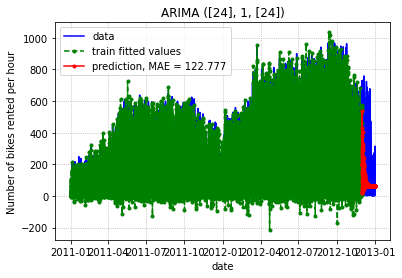

In [ ]:
plt.plot(data_target.index, data_target, '-b', label="data")
plt.plot(arima_model.fittedvalues, '--og', markersize=3,
         label="train fitted values")
plt.plot(test.index, prediction_arima_test, '-or', markersize=3,
         label=f"prediction, MAE = {mae_arima:0.3f}")
plt.grid(linestyle=':')
plt.legend()
plt.xlabel("date")
plt.ylabel("Number of bikes rented per hour")
plt.title(f"ARIMA {(p, d, q)}")
plt.show(True)

We can see that the results of prediction tend to a constant very fast as the further the results go they are based on previous predicte result. I think in this case optimal hyperparameters are p=7*24 and q=24 and d=1, but I was unable to run it, as the model is very slow.

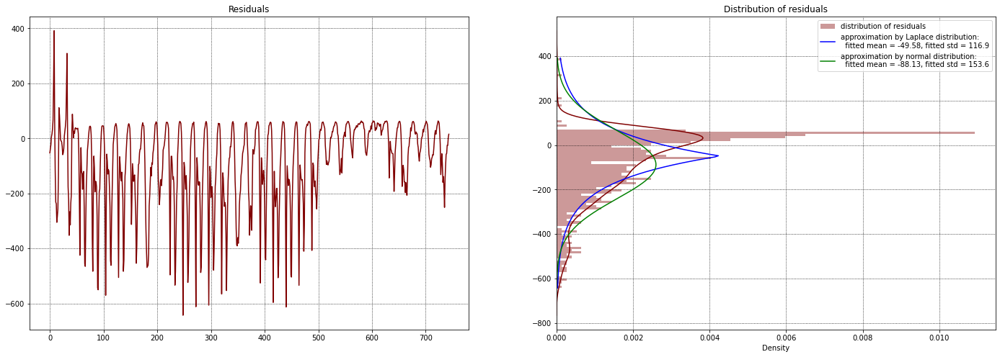

In [ ]:
resid = prediction_arima_test.reset_index()["predicted_mean"] - test.reset_index()["cnt"]
residual_plot(resid)

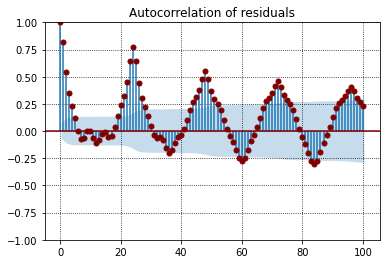

In [ ]:
lags = 100

plot_acf(resid.dropna(), lags=lags, color='maroon',
         title='Autocorrelation of residuals');
plt.grid(linestyle=':', color='k')
plt.show()

Very high autocorrelation in residuals and very high MAE score, I think this model could perform better with optimal hyperparameters.

## 5.6 Hyperparameter Tunning

### Time Series Validation Split

In [ ]:
def ts_validation_split(data_target, N_test=31*24):
    train_ind = np.arange(len(data_target)-N_test)
    test_ind = np.arange(len(data_target)-N_test, len(data_target))

    train_data = data_target[:len(data_target)-N_test]
    test_data = data_target[len(data_target)-N_test:len(data_target)]
    return train_data, test_data, train_ind, test_ind

This function you can call iteratively and get validation set deeper and deeper in time.

### Tunning ARIMA

Given that after first derivation of the target values we got a stationary process, I will take the value of d=1, as by differentiating more we increase the magnitude of noise as well. However we can easily include d as well and try different values as long as we have the suffitient computing power, because the ARIMA model is very slow and depends on the lag size, which in our case is a big number as we have a very friquent data.

In [ ]:
train_data, valid_data, train_ind, valid_ind = ts_validation_split(train)

In [ ]:
%%time

def objective(space):
    params = {
        "order": space["order"]
    }

    arima_model = ARIMA(
        train_data,
        **params
        ).fit()

    prediction_arima_test = arima_model.predict(valid_ind[0], valid_ind[-1])
    score = mean_absolute_error(y_true=test, y_pred=prediction_arima_test)
    print("MAE {:.3f} params {}".format(score, params))
    return {'loss': score, 'status': STATUS_OK }

space = {
    "order": hp.choice("order", [[[24], 1, [24]], [[24*7], 1, [24]]])
    }

best = fmin(fn=objective,
            space=space,
            algo=tpe.suggest,
            max_evals=2)

I have 2 main hypothesis for hyperparameters for the ARIMA model so I put them in the space of choice, we defenitely can increase the number of possible variations and probably will get better scores. However the model is very slow and does not finish with p=24*7, so I will not run this part of the code. In colab I was unable to finish it as the runtime was restarting and on my computer it would crash because of memory issue.

## 5.7 Holt Winters

In [ ]:
holt_winters = ExponentialSmoothing(train, seasonal_periods=24,
                                    trend='add', seasonal='add',
                                    use_boxcox=False,
                                    initialization_method="estimated").fit()
fcast_hw = holt_winters.forecast(len(test))
fcast_hw = pd.Series(fcast_hw)
fcast_hw.index = test.index

mae_hw = mean_absolute_error(y_true=test, y_pred=fcast_hw)

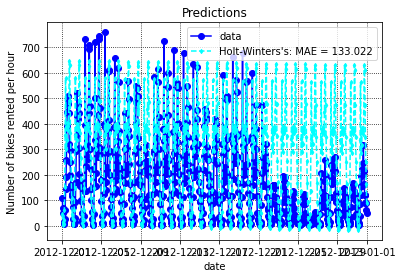

In [ ]:
plt.plot(test.index, test, '-bo', markersize=6, label="data")
plt.plot(test.index, fcast_hw, '--d', color='cyan',
         markersize=3, markerfacecolor='cyan', markeredgecolor='cyan',
         label=f"Holt-Winters's: MAE = {mae_hw:0.3f}")
plt.grid(linestyle=':', color='k')
plt.legend()
plt.xlabel("date")
plt.ylabel("Number of bikes rented per hour")
plt.title("Predictions")
plt.show()

The result is much worse than the ARIMA model or model of seasonal decomposition. I tried this model with different seasonalities, but this was the best one.

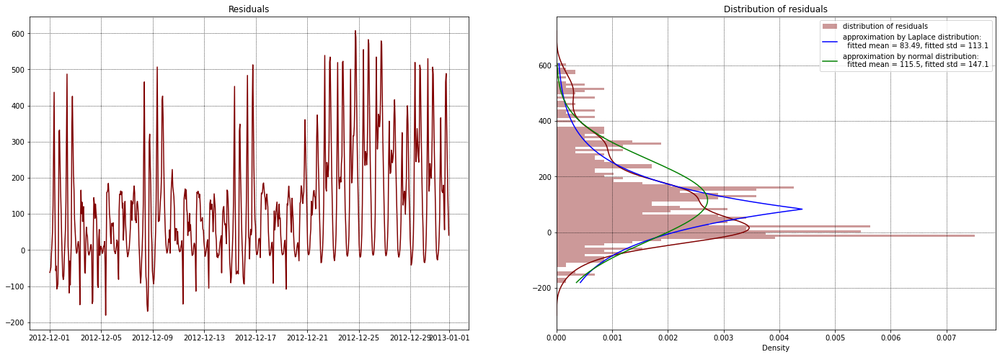

In [ ]:
resid = fcast_hw - test
residual_plot(resid)

Here residuals are not even centered around the mean. The results are really unsatisfactory.

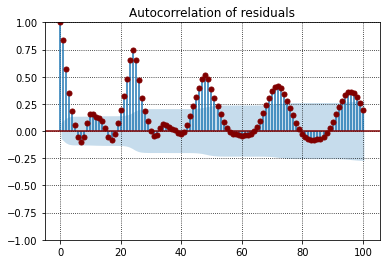

In [ ]:
lags = 100

plot_acf(resid.dropna(), lags=lags, color='maroon',
         title='Autocorrelation of residuals');
plt.grid(linestyle=':', color='k')
plt.show()

In this case there is even 12 hour seasonality left in the residual. Not a white noise. Not the best model for our problem.

# 6. Additional

## 6.1 Prophet

In [ ]:
data_target_prop = data[["datetime", "cnt"]]
data_target_prop.rename(
    columns={"datetime": "ds", "cnt": "y"},
    inplace=True,
)

In [ ]:
N_test = 31*24
print(f"We have {len(data_target_prop)} points totally and last {N_test} test points amongst them.")

train_ind = np.arange(len(data_target_prop)-N_test)
test_ind = np.arange(len(data_target_prop)-N_test, len(data_target_prop))

train_prop = data_target_prop[:len(data_target_prop)-N_test]
test_prop = data_target_prop[len(data_target_prop)-N_test:len(data_target_prop)]

We have 17544 points totally and last 744 test points amongst them.


In [ ]:
prop = Prophet()
prop.fit(train_prop)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mnbgo_9/8k_xubs4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mnbgo_9/t5yn7n6u.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=6997', 'data', 'file=/tmp/tmp1mnbgo_9/8k_xubs4.json', 'init=/tmp/tmp1mnbgo_9/t5yn7n6u.json', 'output', 'file=/tmp/tmp1mnbgo_9/prophet_modelb94ecg3d/prophet_model-20230314145845.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:58:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:59:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [ ]:
pred = prop.predict(test_prop[["ds"]])

In [ ]:
predictions = pred[["yhat", "ds"]]
predictions = predictions.set_index(['ds'])
predictions.head()

,yhat
ds,
2012-12-01 00:30:00,130.158690
2012-12-01 01:30:00,113.601513
2012-12-01 02:30:00,72.347623
2012-12-01 03:30:00,33.051400
2012-12-01 04:30:00,34.405303


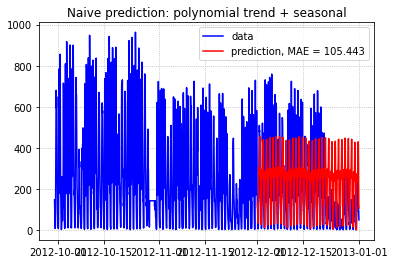

In [ ]:
mae_naive = mean_absolute_error(test, predictions)

plt.plot(data_target[len(data_target)-3*N_test:].index, data_target[len(data_target)-3*N_test:], '-b', label="data")
# plt.plot(trend[X_train.index][len(data_target)-3*N_test:].index, trend_pred_train[len(data_target)-3*N_test:], '--g', label="quadric trend")

plt.plot(test.index, predictions, '-r', label=f"prediction, MAE = {mae_naive:0.3f}")
# plt.plot(test.index, trend_pred, '--m', label=f"predicted trend")
plt.grid(linestyle=':')
plt.legend()
plt.title("Naive prediction: polynomial trend + seasonal")
plt.show()

Prophet model got quite low MAE score, but we can see that it did a poor job identifing the trend and its results are mainly based on seasonality.

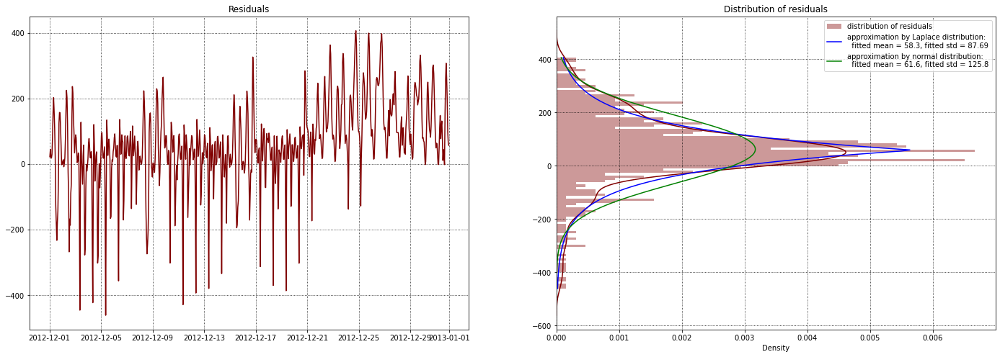

In [ ]:
resid = predictions["yhat"] - test
residual_plot(resid)

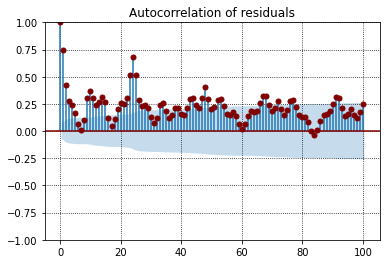

In [ ]:
lags = 100

plot_acf(resid.dropna(), lags=lags, color='maroon',
         title='Autocorrelation of residuals');
plt.grid(linestyle=':', color='k')
plt.show()

Very similar autocorrelation in residuals in comparison to other models. Not a white noise.

## 6.2 SARIMAX

In [ ]:
q, d, p, s = [24], 1, [24], 24*7

sarimax_model = SARIMAX(train, X = X_train_tr, seasonal_order=(p, d, q, s)).fit()
print()
print(f"SARIMAX model ({p}, {d}, {q}, {s}):")
print(arima_model.params)

prediction_sarimax_train = sarimax_model.predict(train.index[0], train.index[-1], X = X_test_tr)
prediction_sarimax_test = sarimax_model.predict(test_ind[0], test_ind[-1], X = X_test_tr)

mae_sarimax = mean_absolute_error(y_true=test, y_pred=prediction_sarimax_test)

In [ ]:
plt.plot(data_target.index, data_target, '-b', label="data")
plt.plot(sarimax_model.fittedvalues, '--og', markersize=3,
         label="train fitted values")
plt.plot(test.index, prediction_sarimax_test, '-or', markersize=3,
         label=f"prediction, MAE = {mae_sarimax:0.3f}")
plt.grid(linestyle=':')
plt.legend()
plt.xlabel("date")
plt.ylabel("Number of bikes rented per hour")
plt.title(f"SARIMAX {(p, d, q, s)}")
plt.show(True)

So the SARIMAX model like the ARIMA model with high values of periodicity or seasonality works very slow. So for this part I will just leave the code.

# 7. Conclusion

I think the best results were given by the combined model of endogenous and exogenous variables train on Cat Boost Regressor algorithm. Despite we still got autocorrelation in residuals, this model was the closest to obtain white noise residuals, and had the lowest MAE value.

In [ ]:
poly_coeff = np.polyfit(X_train_ind, y_train_trend, 4)
print(poly_coeff)
trend_pred = np.polyval(poly_coeff, test_ind)
test_pred = trend_pred + seasonal_component(test_ind, period=24, seasonal=seasonal_second) + seasonal_component(test_ind, period=24*7, seasonal=seasonal)
train_trend_pred = np.polyval(poly_coeff, train_ind)
train_pred = train_trend_pred + seasonal_component(train_ind, period=24*7, seasonal=seasonal)
X_train_tr["ts_preds"] = train_pred
X_test_tr["ts_preds"] = test_pred

[-9.00241167e-14  3.06419918e-09 -3.38497264e-05  1.43594784e-01
 -3.10383255e+01]


In [ ]:
print(len(train_pred))

16800


In [ ]:
cat_reg = CatBoostRegressor(verbose=False, random_state=seed)
cat_reg.fit(X_train_tr, y_train)
predictions = cat_reg.predict(X_test_tr)

print_reg_metrics(y_test, predictions, X_train_tr.shape[1])

R2 score: 0.8649303517831541 
R2 Adjusted: 0.8617675638772501 
RMS Error: 60.55794929968289 
MS Error: 3667.2652233829635 
MA Error: 42.083089408306094


Here I will also apply a function to make the results positive integers as we are dealing with bikes rented per hour so they have to be countable.

In [ ]:
def make_pos_int(x):
  if x > 0:
    return round(x)
  else:
    return 0
to_int = np.vectorize(make_pos_int)
predictions = to_int(predictions)

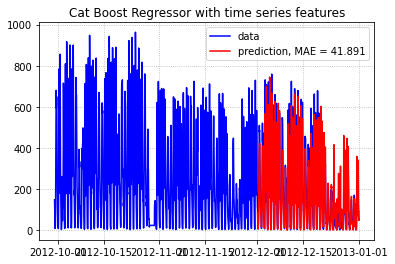

In [ ]:
mae_naive = mean_absolute_error(test, predictions)

plt.plot(data_target[len(data_target)-3*N_test:].index, data_target[len(data_target)-3*N_test:], '-b', label="data")
# plt.plot(trend[X_train.index][len(data_target)-3*N_test:].index, trend_pred_train[len(data_target)-3*N_test:], '--g', label="polynomial trend")

plt.plot(test.index, predictions, '-r', label=f"prediction, MAE = {mae_naive:0.3f}")
# plt.plot(test.index, trend_pred, '--m', label=f"predicted trend")
plt.grid(linestyle=':')
plt.legend()
plt.title("Cat Boost Regressor with time series features")
plt.show()

After changing the results to positive integers we got a little change in MAE score, however still this is the best result.

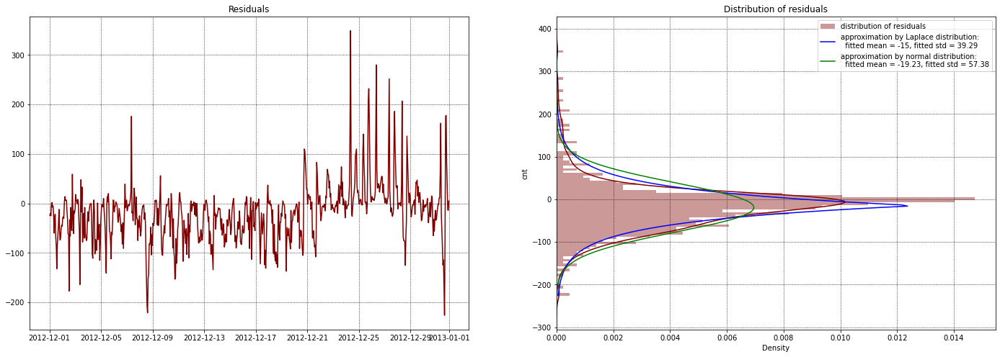

In [ ]:
resid = predictions - test
residual_plot(resid)

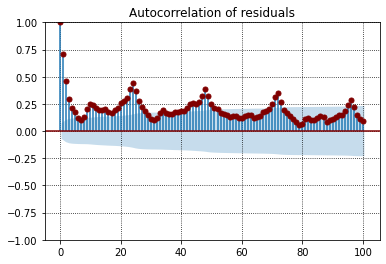

In [ ]:
lags = 100

plot_acf(resid.dropna(), lags=lags, color='maroon',
         title='Autocorrelation of residuals');
plt.grid(linestyle=':', color='k')
plt.show()

Even the best model that had both indogenous and exogenous variables, was unables to get rid of autocorrelation in the residuals.